In [12]:
import torch
import matplotlib.pyplot as plt
from speechbrain.lobes.models.huggingface_wav2vec import HuggingFaceWav2Vec2
from speechbrain.dataio.dataio import read_audio


# model_hub = "/users/lmaison/for_ryan/large/CKPT+2023-09-15+01-30-48+00"
path = "/users/lmaison/for_ryan/base"

In [13]:
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml

# this is a simplified SpeechBrain class for inference only
class ASR(sb.core.Brain):
    def compute_forward(self, waveform):
        # move waveform to device
        waveform = waveform.to(self.device)

        # Forward pass >>>
        
        # Transformer model
        features = self.modules.wav2vec2(waveform)
        
        # Head model
        x = self.modules.enc(features)        
        logits = self.modules.ctc_lin(x)
        log_probabilities = sb.nnet.activations.Softmax(apply_log=True)(logits)

        return log_probabilities

# loads the YAML file containing the hyperparameters
with open(path + "/hyperparams_w2v2_base.yaml") as fin:
    hparams = load_hyperpyyaml(fin)


# this instantiate the ASR class
asr_brain = ASR(modules=hparams["modules"], checkpointer=hparams["checkpointer"])

# this loads the checkpoint
asr_brain.on_evaluate_start()

# load the tokenizer and affect it to the ASR model
# tokenizer = SentencePiece(model_dir="tokenizer", vocab_size=76, model_type="char")
# asr_brain.tokenizer = tokenizer

def infer(waveform):
    output = asr_brain.compute_forward(waveform.unsqueeze(0))

In [14]:
audio_file = "/users/lmaison/for_ryan/samples/common_voice_fr_18027195.wav"
signal = read_audio(audio_file).unsqueeze(0)
with torch.no_grad():
    outputs = asr_brain.modules.wav2vec2.model(signal, output_attentions=True)

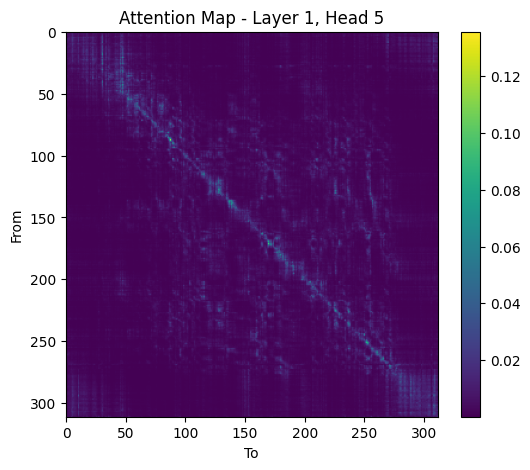

In [15]:
# Extract the attention weights
attention_weights = outputs.attentions

# Choose a layer and head to visualize (e.g., layer 1, head 2)
layer = 1
head = 5

# Get the attention weights for the selected layer and head
attention_weights_layer_head = attention_weights[layer][0][head]

# Plot the attention map as a heatmap
plt.figure(figsize=(6, 5))
plt.imshow(attention_weights_layer_head, cmap='viridis', aspect='auto')
plt.title(f'Attention Map - Layer {layer}, Head {head}')
plt.xlabel('To')
plt.ylabel('From')
plt.colorbar()
plt.show()

In [17]:
# model.model.encoder

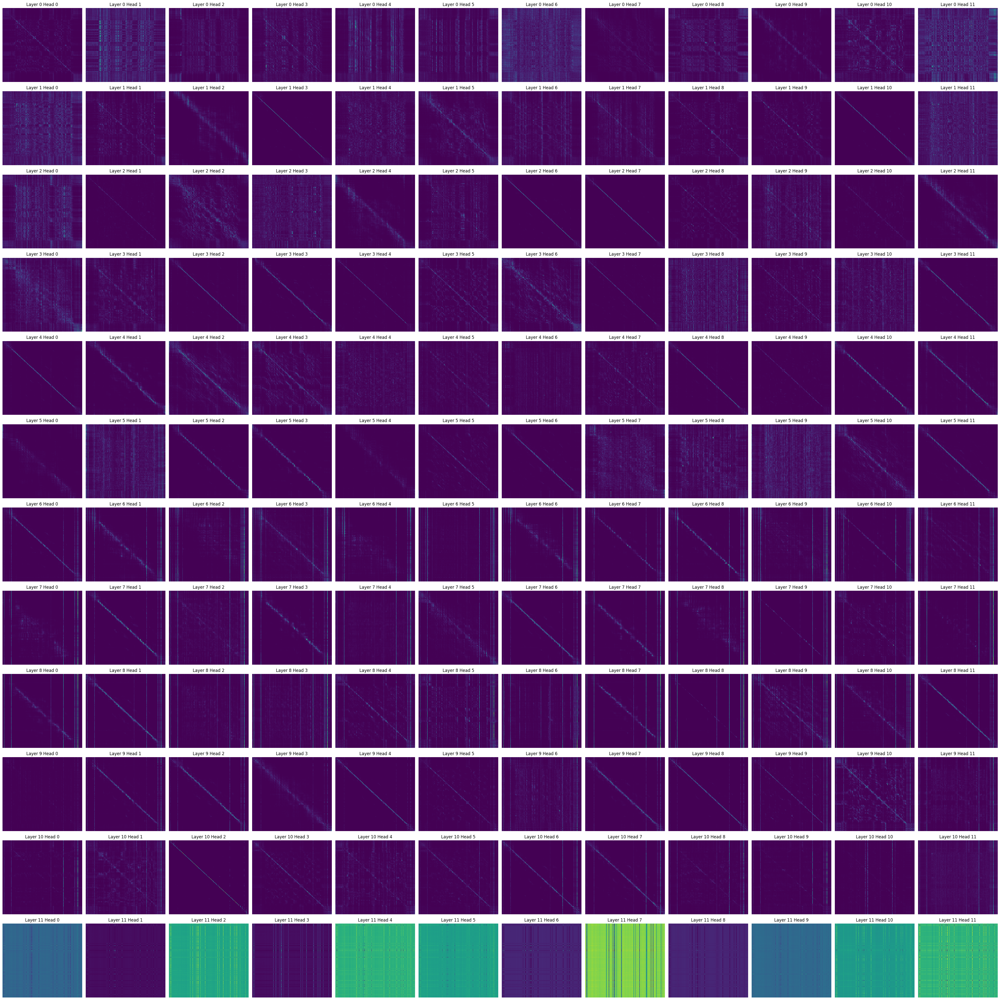

In [16]:
import matplotlib.pyplot as plt

# Create example matrices (you should replace these with your own data)
num_layer = 12
num_heads = 12
# matrix_data = [np.random.rand(10, 10) for _ in range(num_rows * num_cols)]

# Set up the figure and subplots
fig, axes = plt.subplots(num_layer, num_heads, figsize=(40, 40))

# Loop through matrices and create subplots
for i in range(num_layer):
    for j in range(num_heads):
        ax = axes[i, j]
        attention_weights_layer_head = attention_weights[i][0][j]
        
        # Plot the matrix as an image
        ax.imshow(attention_weights_layer_head, cmap='viridis', aspect='auto')
        
        # Optionally, you can add labels or other customization here
        ax.set_title(f'Layer {i} Head {j}')
        ax.axis('off')  # Turn off axis labels
        
# Adjust spacing between subplots if needed
plt.tight_layout()

# Show the plot
plt.show()

In [17]:
def get_diagonality(matrix):
    x, y = matrix.shape
    # print(matrix.shape)
    
    c = torch.zeros(x)
    for i in range(x):    
        s = torch.zeros(y)
        for j in range(y):
            
            # get weighted value
            s[j] = matrix[i,j] * abs(i-j)      
        # get max distance from i
        max = (torch.full((1,y),i) - torch.arange(y)).abs().max()
        # print('sum: ', s.sum())
        # print('max: ', max)
        
        # 1 - weighted sum / max distance
        c[i] = 1 - ( s.sum() / max )
    # print('c: ', c)
    return c.mean()

In [18]:
t = torch.tensor([[1,0,0,0,0]])
get_diagonality(t) # should give 1

tensor(1.)

In [19]:
t = torch.tensor([[0,0,0,0,1]])
get_diagonality(t) # should give 0

tensor(0.)

In [8]:
t = torch.tensor([[0.2,0.2,0.2,0.2,0.2]])
get_diagonality(t) # should give 0.5

tensor(0.5000)

In [20]:
t = torch.tensor([
    [0.2,0.2,0.2,0.2,0.2],
    [1,0,0,0,0],
    [0,0,0,0,1],
])
get_diagonality(t)

tensor(0.3889)

## Get Diagonality of base 
(and maybe large later)

In [ ]:
from tqdm import tqdm


In [21]:
D_base = torch.zeros(num_layer, num_heads)
for i in tqdm(range(num_layer)):
    for j in range(num_heads):
        attention_weights_layer_head = attention_weights[i][0][j]
        D_base[i,j] = get_diagonality(attention_weights_layer_head)

In [22]:
torch.save(D_base, 'base_fine_tuned_base.pt')

In [23]:
# model_hub = "LeBenchmark/wav2vec2-FR-7K-large"
# save_path = "model"
# model = HuggingFaceWav2Vec2(model_hub, save_path)

# signal = read_audio('../best-rq-test/spk1_snt1.wav').unsqueeze(0)
# with torch.no_grad():
#     outputs = model.model(signal, output_attentions=True)

# attention_weights = outputs.attentions


In [40]:
# num_layer = 24
# num_heads = 16
# D_large = torch.zeros(num_layer, num_heads)
# for i in range(num_layer):
#     for j in range(num_heads):
#         attention_weights_layer_head = attention_weights[i][0][j]
#         D_large[i,j] = get_diagonality(attention_weights_layer_head)


In [23]:
D_base[0,11]
# D_large.mean(dim=1)

tensor(0.5563)

## Plot Diagonalities

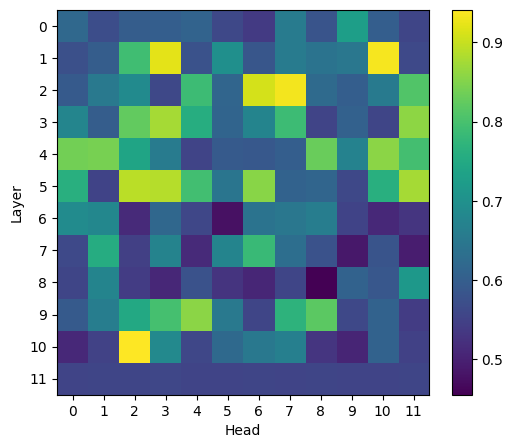

In [24]:
plt.figure(figsize=(6, 5))
plt.imshow(D_base, cmap='viridis', aspect='auto')

x_ticks_interval = 1
y_ticks_interval = 1

# Set the ticks for the x-axis and y-axis
plt.xticks(torch.arange(0, D_base.shape[1], x_ticks_interval))
plt.yticks(torch.arange(0, D_base.shape[0], y_ticks_interval))

# plt.title(f'Attention Map - Layer {layer}, Head {head}')
plt.xlabel('Head')
plt.ylabel('Layer')
plt.colorbar()
plt.show()

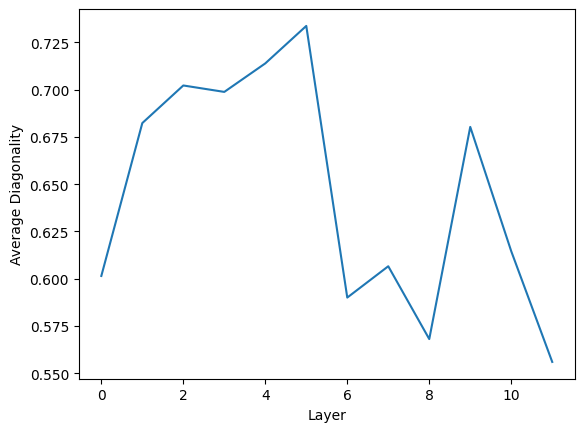

In [27]:
x = torch.arange(12)
y_b = D_base.mean(dim=1)
# y_l = D_large.mean(dim=1)


# Create a line plot
plt.plot(x, y_b)
# plt.plot(x, y_l)

# Add labels and title
plt.xlabel('Layer')
plt.ylabel('Average Diagonality')
plt.title('')

# Display the plot
plt.show()